In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from IPython import display 

# Load data

In [2]:
df = pd.read_pickle("../../data/interim/01_data_processed.pkl")

# Plot single columns

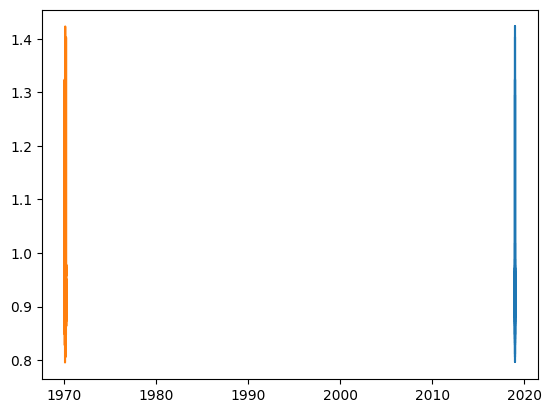

In [3]:
set_df = df[df["set"] == 1]
plt.plot(set_df["acc_y"])

plt.plot(set_df["acc_y"].reset_index(drop=True))

# Plot all exercises

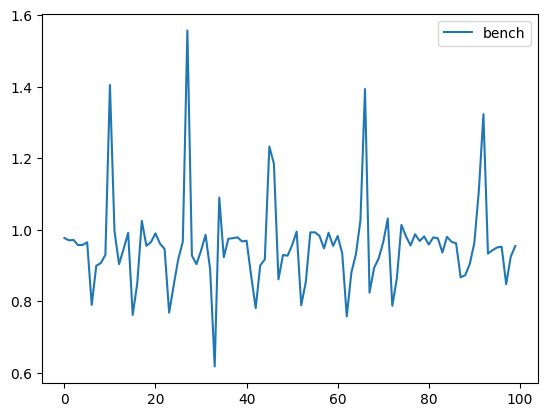

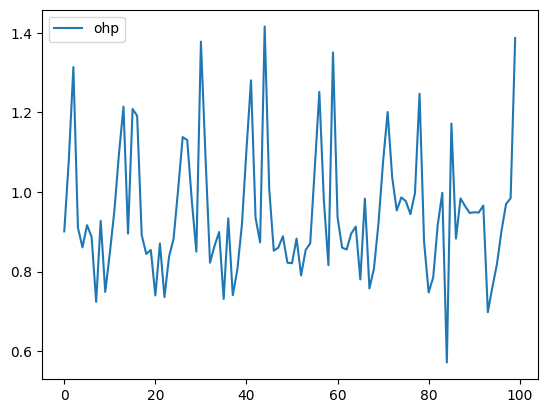

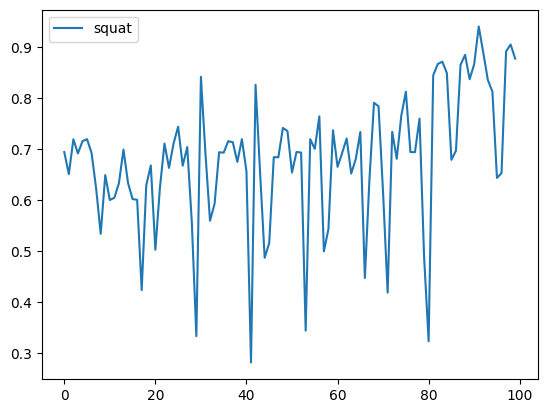

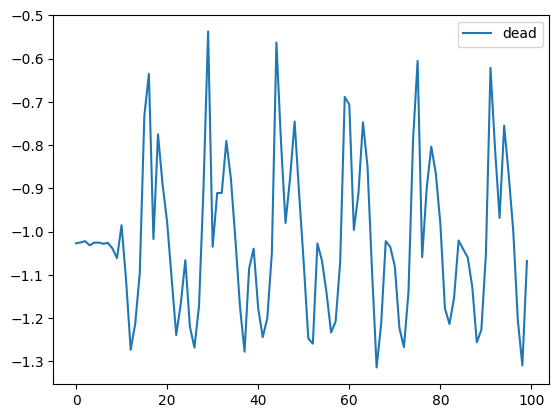

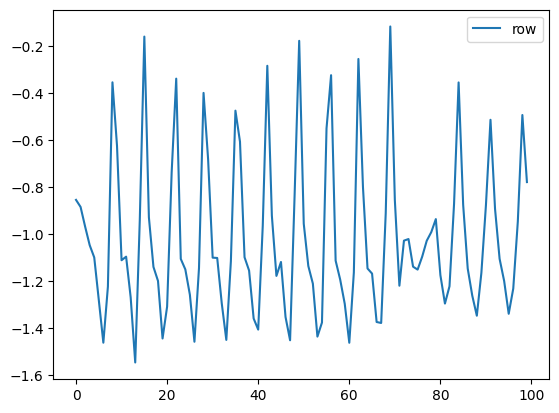

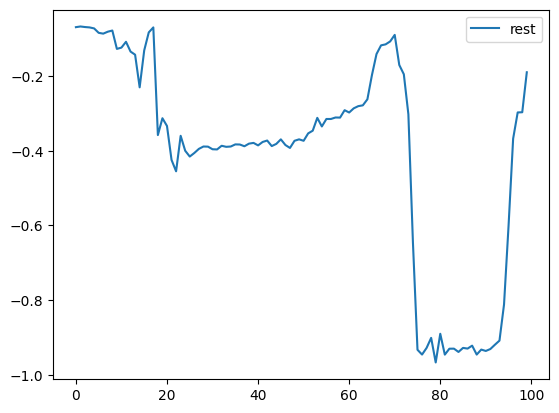

In [4]:
for label in df["label"].unique():
    subset = df[df["label"] == label]
    fig ,ax = plt.subplots()
    plt.plot(subset[:100]["acc_y"].reset_index(drop= True),label=label)
    plt.legend()
    plt.show()

# Adjust plot settings
mpl.style.use("seaborn-v0_8-deep")
mpl.rcParams["figure.figsize"] = (20,5)
mpl.rcParams["figure.dpi"] = 100

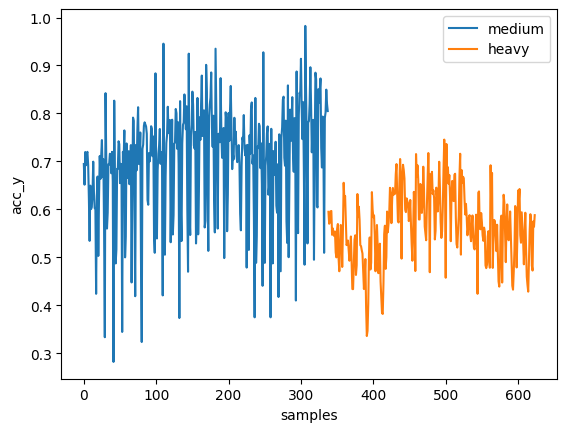

In [5]:
# Filter dataframe for 'squat' label and 'A' participant
category_df = df.query("label == 'squat'").query("participant == 'A'").reset_index()

fig, ax = plt.subplots()
for category in category_df['category'].unique():
    subset = category_df[category_df['category'] == category]
    ax.plot(subset['acc_y'], label=category)
ax.set_ylabel("acc_y")
ax.set_xlabel("samples")
plt.legend()

# Compare participants

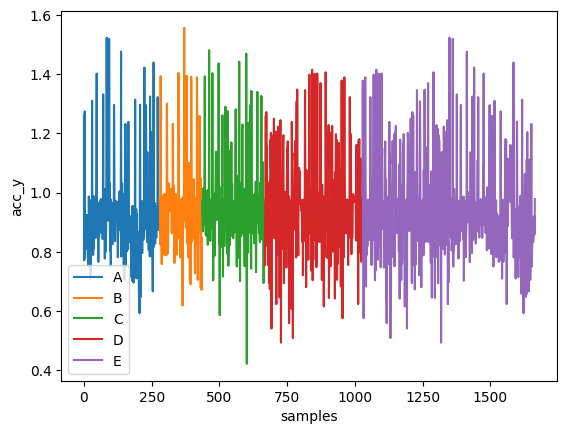

In [6]:
# The first query is missing the participant condition
participant_df = df.query("label == 'bench'").sort_values("participant").reset_index()  

fig, ax = plt.subplots()
for participant in participant_df['participant'].unique():
    subset = participant_df[participant_df['participant'] == participant]
    ax.plot(subset['acc_y'], label=participant)
ax.set_ylabel("acc_y")
ax.set_xlabel("samples")
plt.legend()

# Plot multiple axis

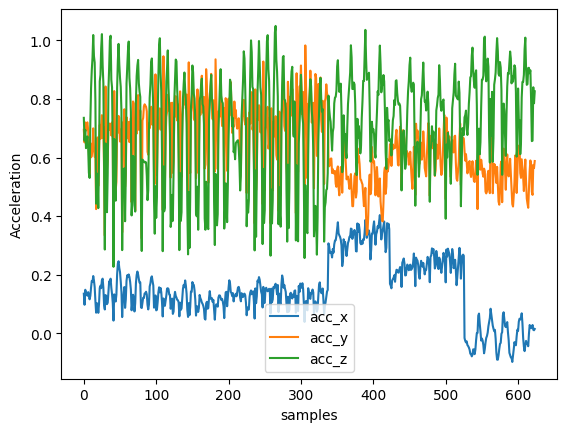

In [7]:
label = "squat"
participant = "A"
all_axis_df = df.query(f"label =='{label}'").query(f"participant == '{participant}'").reset_index()

fig, ax = plt.subplots()
# 
for col in ["acc_x", "acc_y", "acc_z"]:
    ax.plot(all_axis_df[col], label=col)
ax.set_ylabel("Acceleration")
ax.set_xlabel("samples")
plt.legend()


# Create a loop to plot all combinations per sensor

C:\Users\oshad\AppData\Local\Temp\ipykernel_9844\3090481978.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


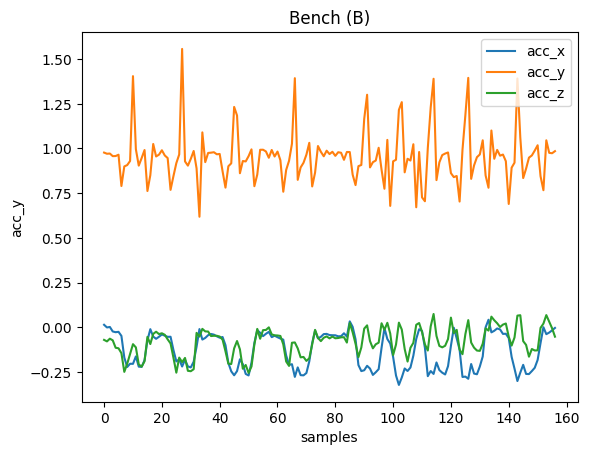

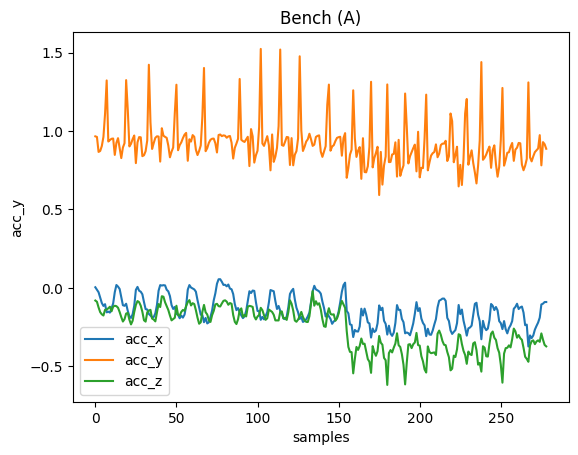

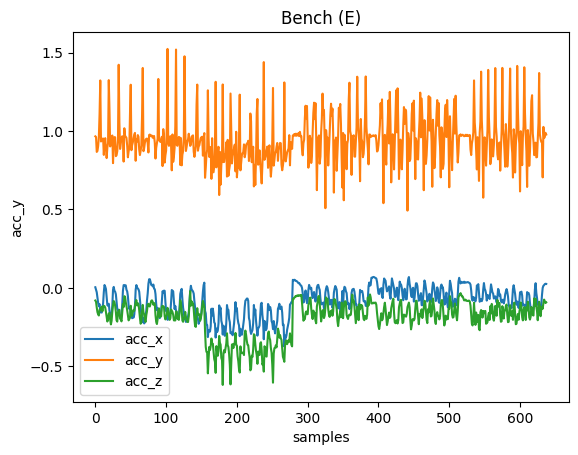

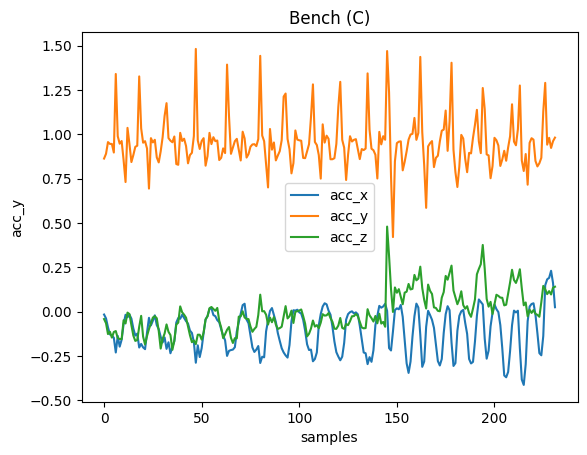

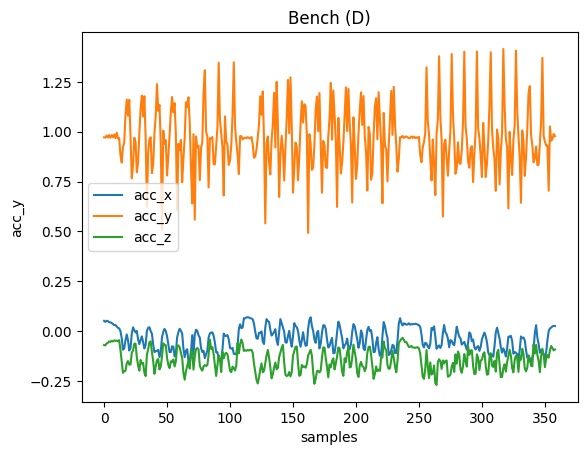

...

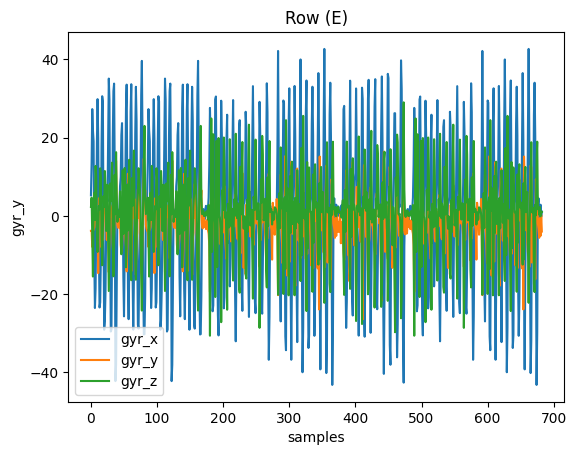

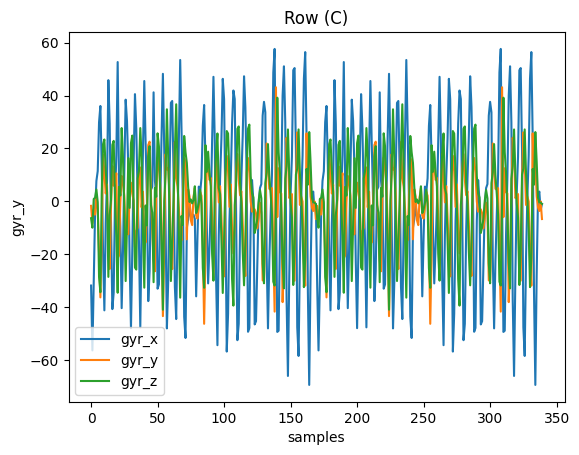

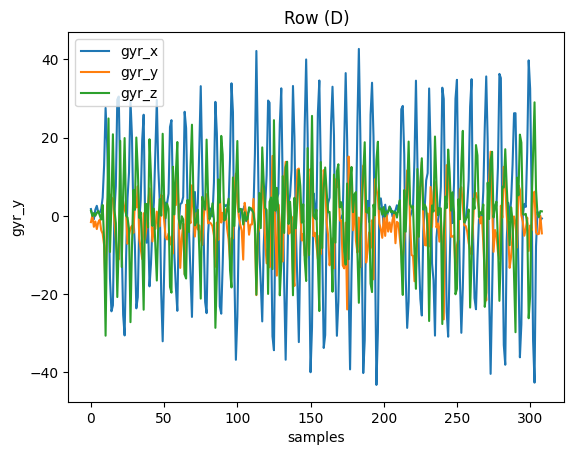

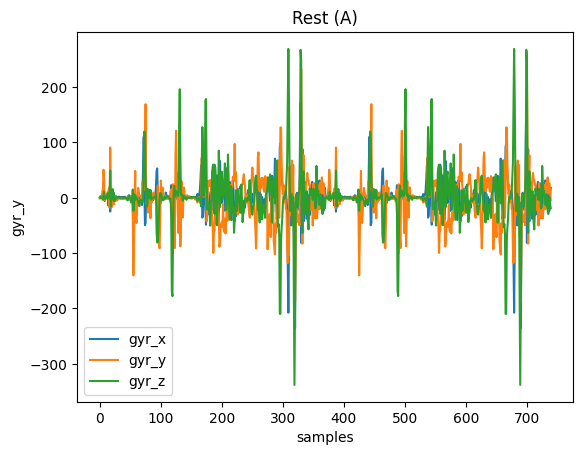

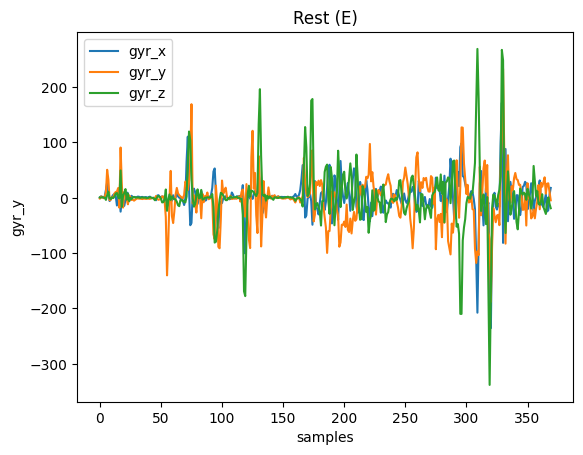

In [8]:
labels = df["label"].unique()
participants = df["participant"].unique()


for label in labels:
    for participant in participants:    
        all_axis_df = (df.query(f"label == '{label}'")
                        .query(f"participant == '{participant}'")
                        .reset_index())

        if len(all_axis_df) > 0:
            fig, ax = plt.subplots()
            for col in ["acc_x", "acc_y", "acc_z"]:
                ax.plot(all_axis_df[col], label=col)
            ax.set_ylabel("acc_y")
            ax.set_xlabel("samples")
            plt.title(f"{label} ({participant})".title())
            plt.legend()
            
for label in labels:
    for participant in participants:    
        all_axis_df = (df.query(f"label == '{label}'")
                        .query(f"participant == '{participant}'")
                        .reset_index())

        if len(all_axis_df) > 0:
            fig, ax = plt.subplots()
            for col in ["gyr_x", "gyr_y", "gyr_z"]:
                ax.plot(all_axis_df[col], label=col)
            ax.set_ylabel("gyr_y")
            ax.set_xlabel("samples")
            plt.title(f"{label} ({participant})".title())
            plt.legend()

# Combine plots in one figure

Text(0.5, 0, 'samples')

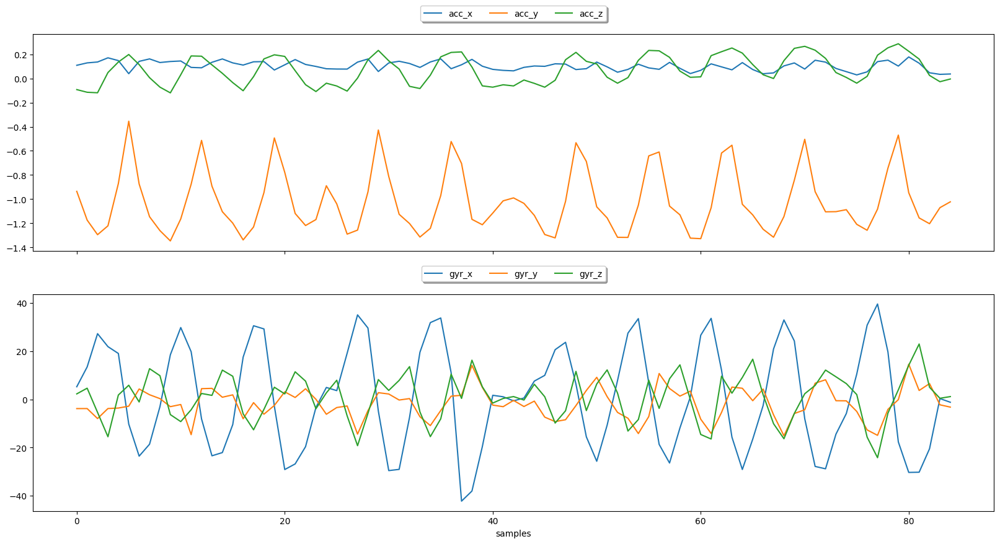

In [9]:
label = 'row'
participant = 'A'

combined_plot_df = df.query(f"label == '{label}' and participant == '{participant}'").reset_index(drop=True)

fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(20,10))

for col in ["acc_x", "acc_y", "acc_z"]:
    ax[0].plot(combined_plot_df[col], label=col)

for col in ["gyr_x", "gyr_y", "gyr_z"]:
    ax[1].plot(combined_plot_df[col], label=col)

ax[0].legend(loc = 'upper center' , bbox_to_anchor = (0.5 , 1.15) , ncol = 3 , fancybox = True , shadow = True)
ax[1].legend(loc = 'upper center' , bbox_to_anchor = (0.5 , 1.15) , ncol = 3 , fancybox = True , shadow = True)

ax[1].set_xlabel('samples')

# Loop over all combinations and export for both sensors

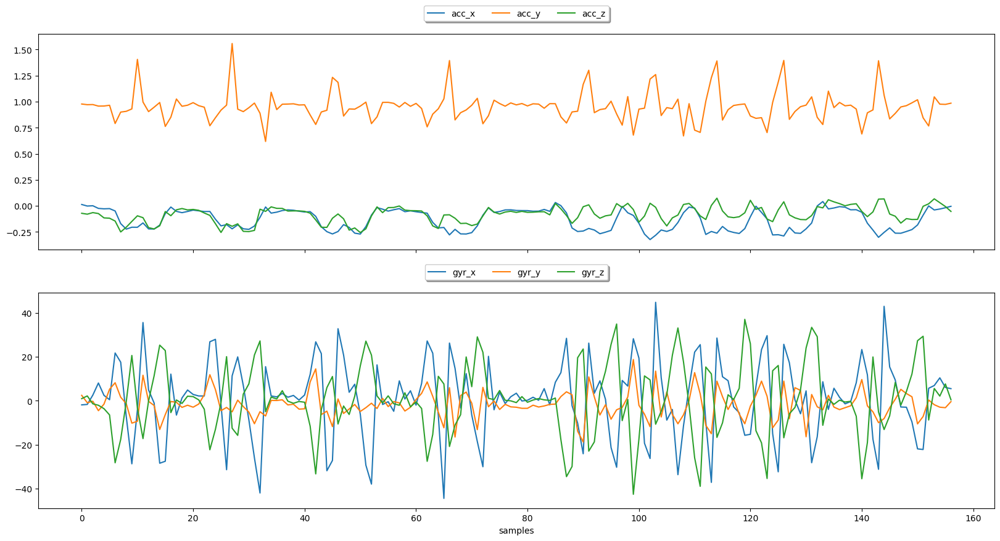

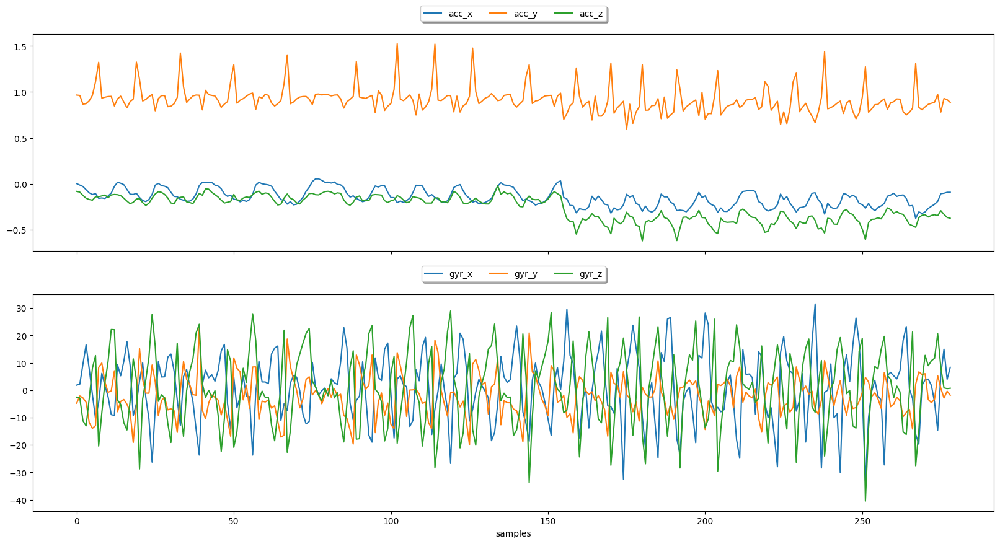

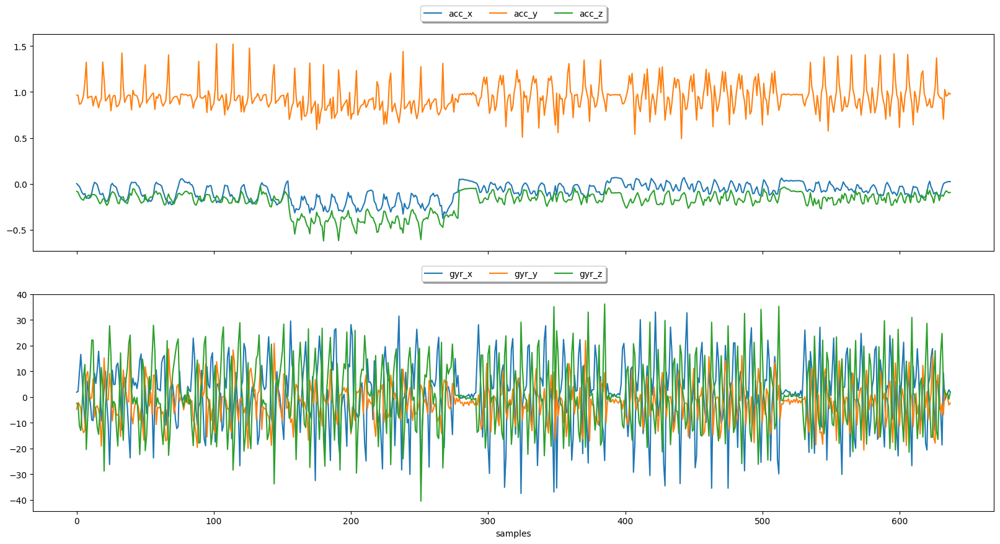

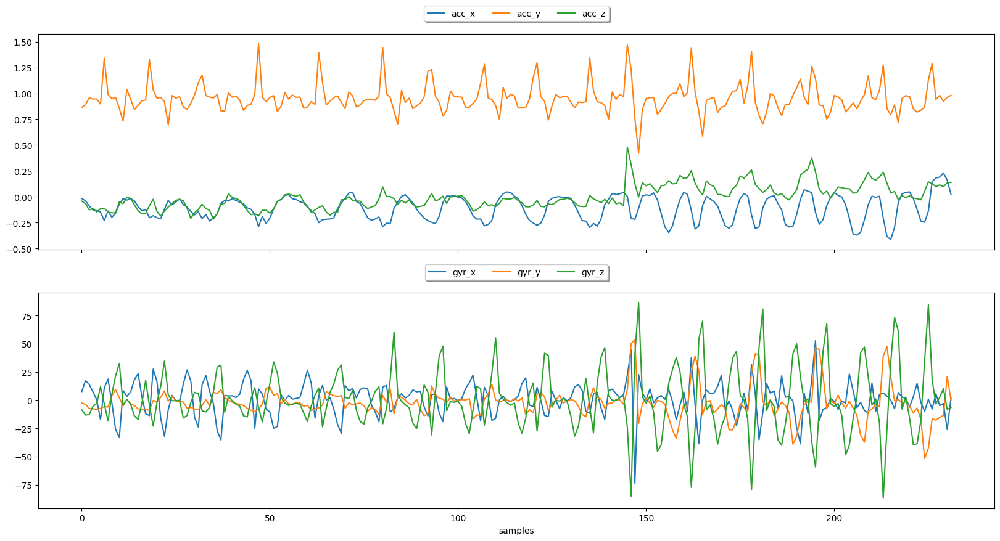

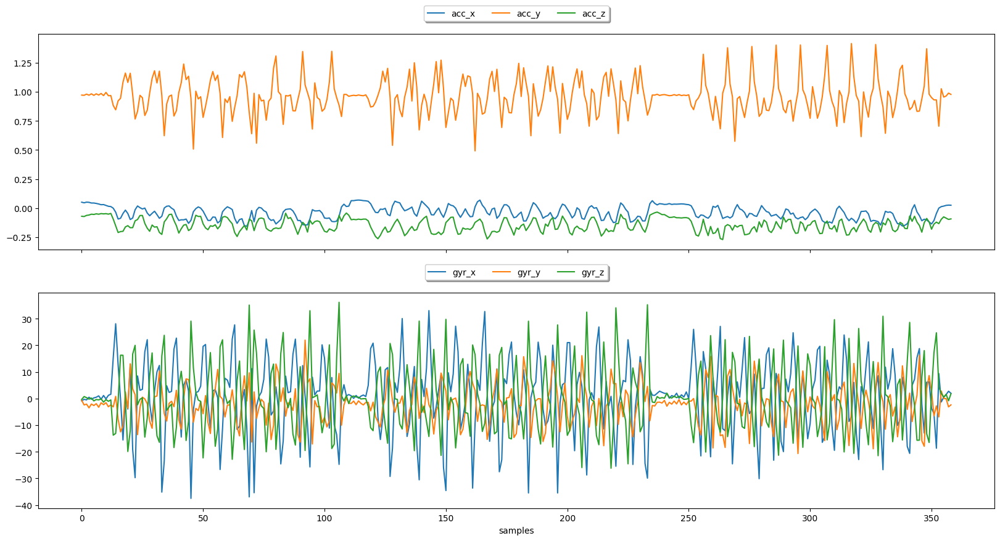

...

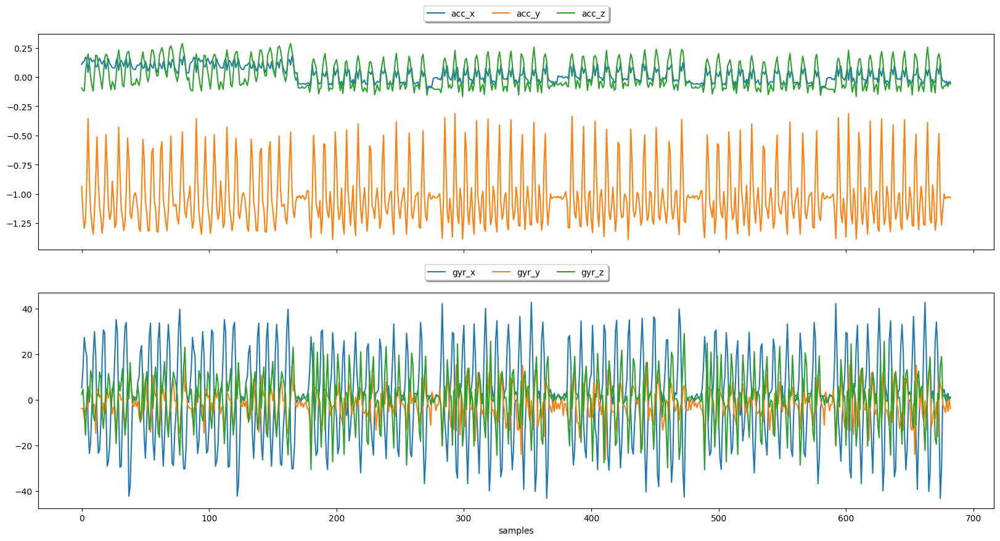

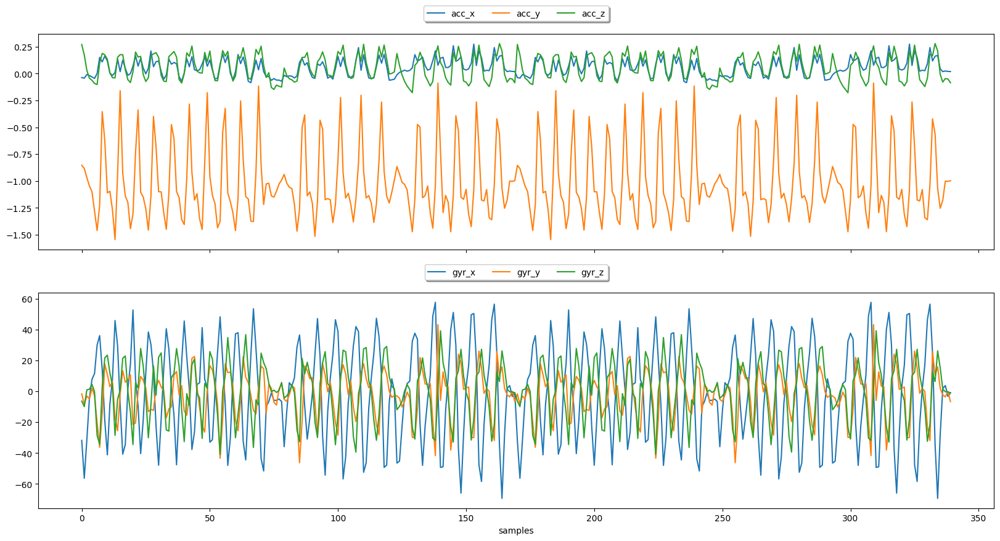

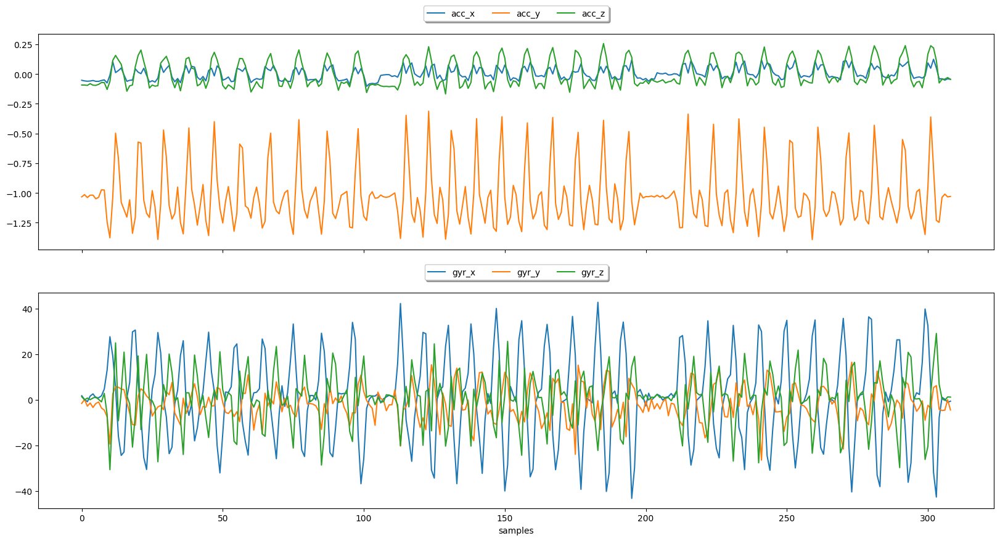

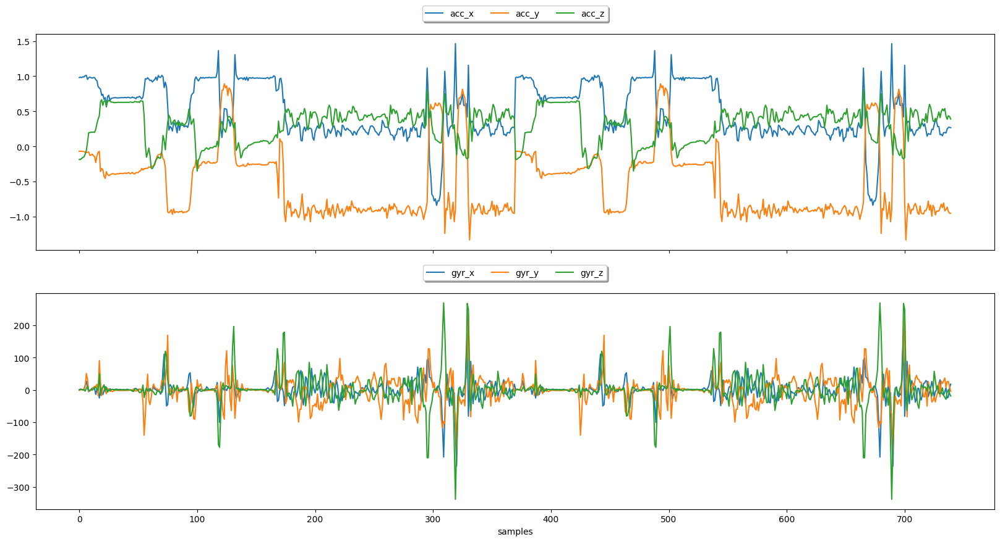

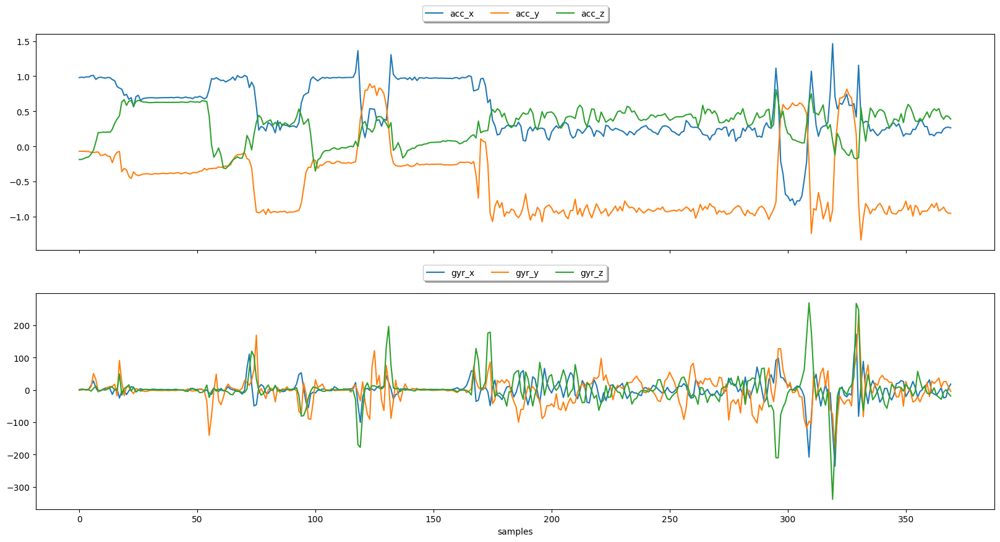

In [10]:
for label in labels:
    for participant in participants:
        
        combined_plot_df = df.query(f" label == '{label}' and participant == '{participant}' ").reset_index(drop=True)
        
        
        if len(combined_plot_df) > 0: # To fillter the empty df (some particpant didn't make some exercises)

            fig , ax = plt.subplots(nrows = 2 ,sharex=True , figsize = (20,10) )

            for col in ["acc_x", "acc_y", "acc_z"]:
                ax[0].plot(combined_plot_df[col], label=col)

            for col in ["gyr_x", "gyr_y", "gyr_z"]:
                ax[1].plot(combined_plot_df[col], label=col)

            ax[0].legend(loc = 'upper center' , bbox_to_anchor = (0.5 , 1.15) , ncol = 3 , fancybox = True , shadow = True)
            ax[1].legend(loc = 'upper center' , bbox_to_anchor = (0.5 , 1.15) , ncol = 3 , fancybox = True , shadow = True)

            ax[1].set_xlabel('samples')
            
            #plt.savefig(f'../../reports/figures/{label.title()}_({participant}).png')
            
            plt.show()